# Systemy inspekcji wizualnej  
## Laboratorium  7 - Detekcja ruchu
dr inż. Łukasz Jeleń

Nazwisko i Imię:  Michał Dams  
Nr albumu:  246783  
data wykonania ćwiczenia: 29.01.2023 

# 1. Narzędzia  
  
  
Na zjęciach korzystamy z pythnona, a jako środowisko pracy mają Państwo do wyboru Google Colab (https://colab.research.google.com) - wersja online, lub Anaconda Navigator (https://www.anaconda.com/) - wymaga instalacji na własnym komputerze. Są to oczywiście tylko propozycje. 

# 2. Zadania. 
  
## Zadanie 1 - Detekcja zmian w obrazie (odejmowanie zdjęć) 
  
Na wyładzie poświęcownym operacjom na orazach mówiliśmy, że poprzez wyznaczenie różnicy między dwoma obrazami (`cv2.absdiff(src1,src2)`) możemy sprawdzić, czy obiekty na obrazach uległy zmianie.  
  
Do wykonania tego zadania proszę wykorzystać zdjęcia zamieszczone na e-portalu. Należy sprawdzić, czy przedmioty na zdjęciach `3.jpg, 4.jpg, 5.jpg` uległy zmianie lub przesunięciu względem zdjecia `1.jpg` z wykorzystaniem różnicy obrazów. Proszę pamięteć, że najlepszy efekt uzyskamu stosując dodatkowe operacje poprawiające efekt odejmowania: opercje morfologiczne, progowanie.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

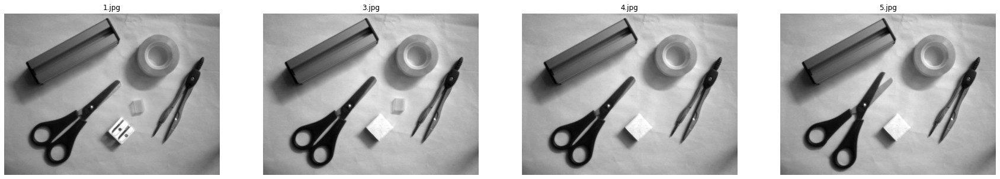

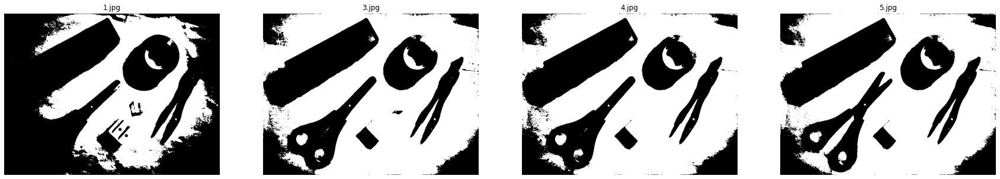

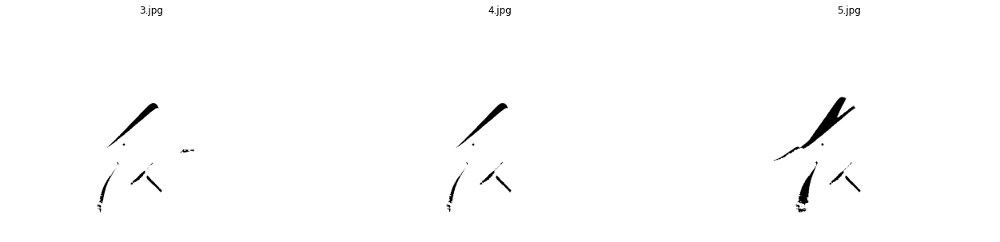

In [ ]:
def show_images(images):
  plt.figure(figsize=(30,20))
  for i, img in enumerate(images):
    plt.subplot(1, 4, i+1) 
    plt.title(f'{img[1]}')
    plt.imshow(img[0], cmap='gray', vmin=0, vmax=255)
    plt.axis('off')


def progowanie_i_odejmowanie(ref_img, image):
  img = image
  for i in range(rows):
        for j in range(cols):
            k = ref_img[i,j]
            if k < 190:
              img[i,j] = 255
  return img


def b_w_transform(img):
  rows,cols = img.shape
  image = np.zeros((rows,cols), np.uint8)
  for i in range(rows):
      for j in range(cols):
          k = img[i,j]
          if k > 160:
            k = 255
          else:
            k = 0
          image[i,j] = k
  return image


ori_images = []
ori_images.append((cv2.imread('/content/1.jpg', cv2.IMREAD_GRAYSCALE), '1.jpg'))
ori_images.append((cv2.imread('/content/3.jpg', cv2.IMREAD_GRAYSCALE), '3.jpg'))
ori_images.append((cv2.imread('/content/4.jpg', cv2.IMREAD_GRAYSCALE), '4.jpg'))
ori_images.append((cv2.imread('/content/5.jpg', cv2.IMREAD_GRAYSCALE), '5.jpg'))

rows,cols = ori_images[0][0].shape
b_w_images = []
for img in ori_images:
  b_w_images.append((b_w_transform(img[0]), img[1]))

show_images(ori_images)
show_images(b_w_images)
abs_diff_images = []

for img in b_w_images[1:]:
  abs_diff_images.append((progowanie_i_odejmowanie(b_w_images[0][0],img[0]), img[1]))

show_images(abs_diff_images)

## Zadanie 2 - Detekcja zmian w obrazie (dzielenie obrzów)

Dzielienie jest kolejną opreacją, którą można wykorzystać w celu detekcji zmian w obrazie.  
  
Do wykonania tego zadania również proszę wykorzystać zdjęcia zamieszczone na e-portalu. Należy sprawdzić, czy przedmioty na zdjęciach 3.jpg, 4.jpg, 5.jpg uległy zmianie lub przesunięciu względem zdjecia 1.jpg z wkorzystaniem ilorazu zdjęć. Proszę pamięteć, że najlepszy efekt uzyskamu stosując dodatkowe operacje poprawiające efekt odejmowania: opercje morfologiczne, progowanie.

<ipython-input-75-754cef22890b>:5: RuntimeWarning: invalid value encountered in ubyte_scalars
  k = image[i,j]/ref_img[i,j]


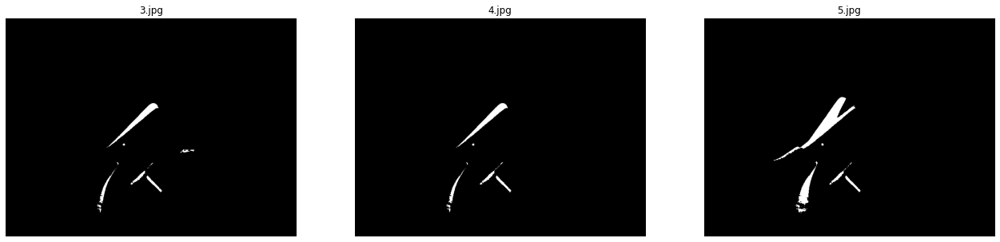

In [ ]:
def divide_images(ref_img, image):
  img = image
  for i in range(rows):
        for j in range(cols):
            k = image[i,j]/ref_img[i,j]
            if k < 0.5:
              img[i,j] = 255
            else:
              img[i,j] = 0
  return img


div_images = []
for img in b_w_images[1:]:
  div_images.append((divide_images(b_w_images[0][0],img[0]), img[1]))
show_images(div_images)

## Zadanie 3 - detekcja ruchu

Techniki wykrywania zmian w obrazach możemy łatwo zastosować do stumienia wideo i zbudować detektor ruchu. W tym celu wczytujemy pierwszą ramkę wideo jako ramka referencyjna, a następnie wykonujemy operację odejmowania lub dzielenia ramki referencyjnej przez kolejne. Ogólny schemat można zapisać:


1.   wczytaj wideo 
2.   zamień ramkę na obraz monochromatyczny 
3. zastosuj filtr wygładzający (np. Gaussowaski)
4. dla kolejnej rami powtórz kroki 2 i 3 
5. Odejmij drugą ramkę od pierwszej 
6. zapisz drugą ramkę jako referencyjną 
7. do wynku odejmowania zastosuj operacje morfologiczne i progowanie
8. z obrazu wynikowego wylicz kontury
9. na podstawie konturów oblicz prostokąt okalający (bounding box)
10. nanieś prostokąt na oryginalne wideo.
11. wyświetl wynik


### Detekcja ruchu z kamery
 
Państwa zadaniem jest napisanie prostej aplikacji, która będzie przetwarzać obraz z kamery komputera i poinformuje użytkownika jeśli w obrazie z kamery zostanie wykrytu ruch. Należy wyświetlić stosowny komunikat w konsoli oraz na podglądzie z kamery. 

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      video.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  return binary

In [ ]:
from IPython.display import Image

frame = take_photo(0.01)

<IPython.core.display.Javascript object>

In [ ]:
import cv2, time, pandas
from datetime import datetime
  
# Assigning our static_back to None
static_back = None
  
# List when any moving object appear
motion_list = [ None, None ]
  
# Time of movement
time = []
  
# Initializing DataFrame, one column is start 
# time and other column is end time
df = pandas.DataFrame(columns = ["Start", "End"])
  
# Capturing video
video = cv2.VideoCapture(0)
take_photo(0.01)
# Infinite while loop to treat stack of image as video
while True:
    # Reading frame(image) from video
    check, frame = video.read()
  
    # Initializing motion = 0(no motion)
    motion = 0
  
    # Converting color image to gray_scale image
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  
    # Converting gray scale image to GaussianBlur 
    # so that change can be find easily
    gray = cv2.GaussianBlur(gray, (21, 21), 0)
  
    # In first iteration we assign the value 
    # of static_back to our first frame
    if static_back is None:
        static_back = gray
        continue
  
    # Difference between static background 
    # and current frame(which is GaussianBlur)
    diff_frame = cv2.absdiff(static_back, gray)
  
    # If change in between static background and
    # current frame is greater than 30 it will show white color(255)
    thresh_frame = cv2.threshold(diff_frame, 30, 255, cv2.THRESH_BINARY)[1]
    thresh_frame = cv2.dilate(thresh_frame, None, iterations = 2)
  
    # Finding contour of moving object
    cnts,_ = cv2.findContours(thresh_frame.copy(), 
                       cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  
    for contour in cnts:
        if cv2.contourArea(contour) < 10000:
            continue
        motion = 1
  
        (x, y, w, h) = cv2.boundingRect(contour)
        # making green rectangle around the moving object
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 3)
  
    # Appending status of motion
    motion_list.append(motion)
  
    motion_list = motion_list[-2:]
  
    # Appending Start time of motion
    if motion_list[-1] == 1 and motion_list[-2] == 0:
        time.append(datetime.now())
  
    # Appending End time of motion
    if motion_list[-1] == 0 and motion_list[-2] == 1:
        time.append(datetime.now())
  
    # Displaying image in gray_scale
    cv2_imshow(gray)
  
    # Displaying the difference in currentframe to
    # the staticframe(very first_frame)
    cv2_imshow(diff_frame)
  
    # Displaying the black and white image in which if
    # intensity difference greater than 30 it will appear white
    cv2_imshow(thresh_frame)
  
    # Displaying color frame with contour of motion of object
    cv2_imshow(frame)
  
    key = cv2.waitKey(1)
    # if q entered whole process will stop
    if key == ord('q'):
        # if something is movingthen it append the end time of movement
        if motion == 1:
            time.append(datetime.now())
        break
  
# Appending time of motion in DataFrame
for i in range(0, len(time), 2):
    df = df.append({"Start":time[i], "End":time[i + 1]}, ignore_index = True)
  
# Creating a CSV file in which time of movements will be saved
df.to_csv("Time_of_movements.csv")
  
video.release()
  
# Destroying all the windows
cv2.destroyAllWindows()

<IPython.core.display.Javascript object>

KeyboardInterrupt: ignored

(360, 640, 3)


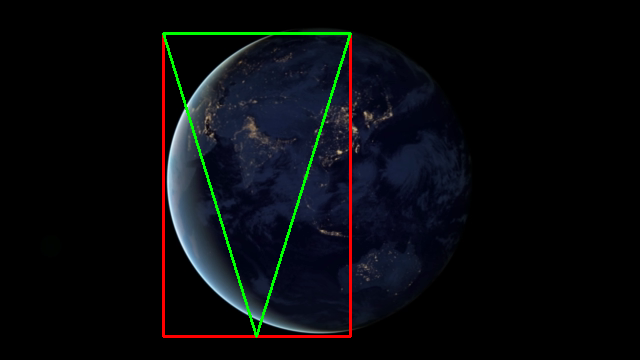

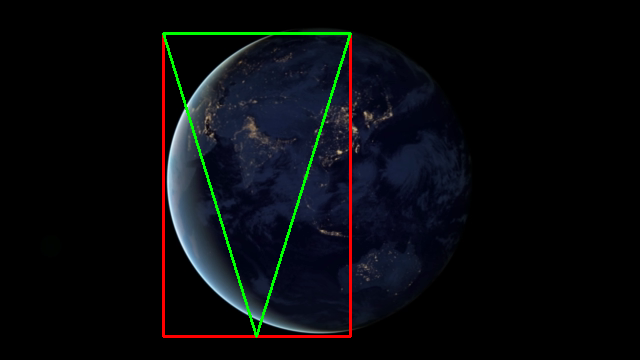

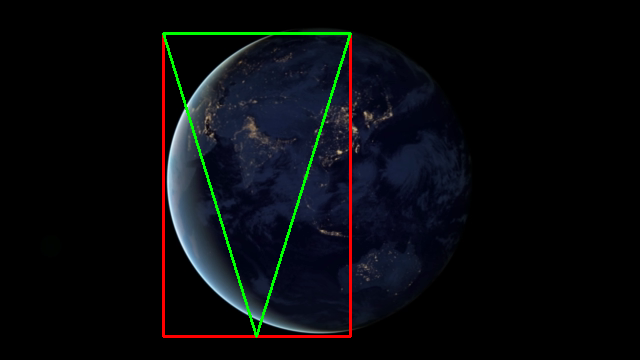

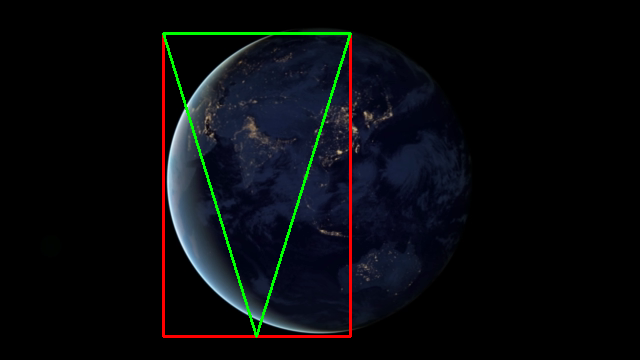

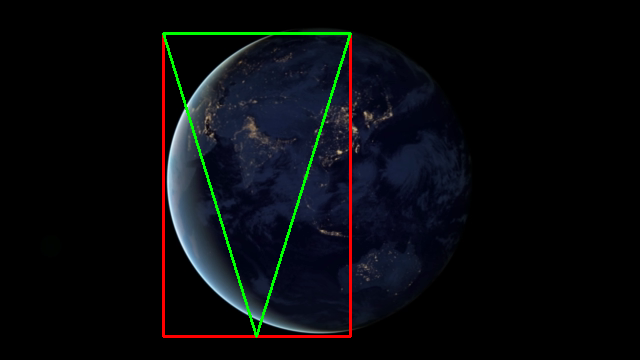

...

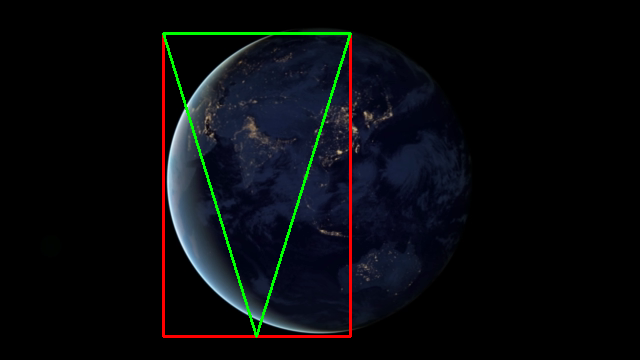

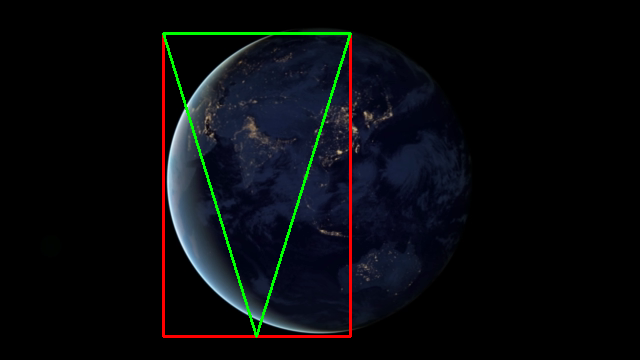

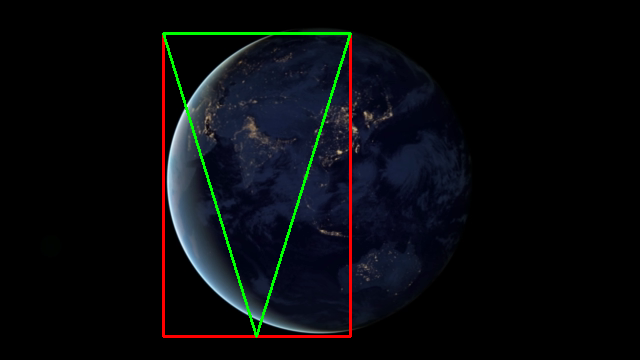

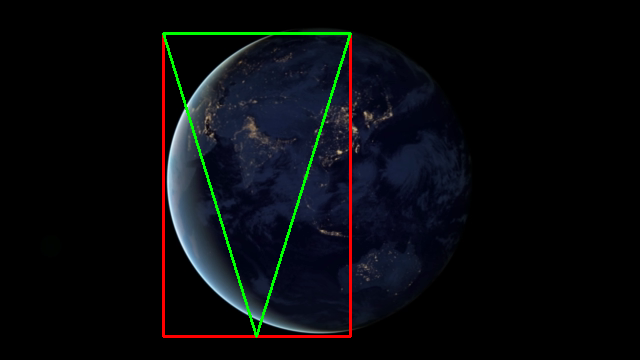

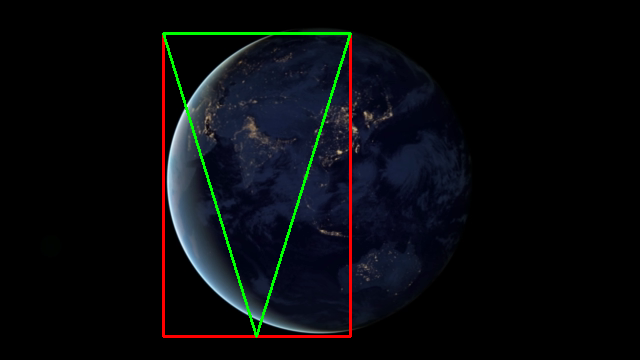

KeyboardInterrupt: ignored

In [ ]:
import cv2
import numpy as np

# Wczytanie video
cap = cv2.VideoCapture("video.mp4")

# Pobranie pierwszej ramki jako referencyjnej
ret, frame = cap.read()
reference = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

while(cap.isOpened()):
    # Wczytanie następnej ramki
    ret, frame = cap.read()
    if not ret:
        break

    # Zamiana koloru na monochromatyczny i filtr Gaussa
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (21, 21), 0)

    # Odejmowanie ramki od referencyjnej
    delta_frame = cv2.absdiff(reference, gray)

    # Wyliczenie konturów
    thresh = cv2.threshold(delta_frame, 25, 255, cv2.THRESH_BINARY)[1]
    contours, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Obliczenie prostokąta okalającego i naniesienie trójkąta na oryginalne video
    for contour in contours:
        (x, y, w, h) = cv2.boundingRect(contour)
        if cv2.contourArea(contour) < 500:
            continue
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 0, 255), 2)
        points = np.array([[x, y], [x + w, y], [x + w / 2, y + h]], np.int32)
        cv2.polylines(frame, [points], True, (0, 255, 0), 2)

    # Wyświetlenie wyniku
    cv2_imshow(frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Zwolnienie kamery
cap.release()
cv2.destroyAllWindows()
